# **Actividad 1: Rips, Cech, Alpha**

In [76]:
# Librerías
import numpy as np  # Para arreglos
import pandas as pd # Para bases de datos
import matplotlib.pyplot as plt # Para graficar 
from matplotlib import cm # Para colores
from scipy.spatial.distance import squareform, pdist # Para matrices de distancias
import matplotlib.patches as mpatches # Para elipses
from matplotlib.collections import PatchCollection # Para elipses
import gudhi # Para hacer la filtración de complejos cimpliciales de Rips y Alpha
import seaborn as sns

## Base de Datos 1

In [77]:
df1 = pd.read_csv('Activity1.csv') # Cargamos la base de datos

# Mostramos la base de datos
display(df1.head())
display(df1.describe())
print("Tamaño del dataframe:", df1.shape)
print("Tipos de datos del dataframe:")
display(df1.dtypes)


,0,1
0,-0.062332,-0.990463
1,1.109356,-0.077222
2,0.553080,-0.938321
3,0.290183,0.813677
4,-0.722770,-0.380330


,0,1
count,100.000000,100.000000
mean,-0.073169,0.000463
std,0.700289,0.732798
min,-1.142208,-1.144156
25%,-0.727509,-0.737348
50%,-0.198949,-0.043047
75%,0.575066,0.755372
max,1.124707,1.160988


Tamaño del dataframe: (100, 2)
Tipos de datos del dataframe:


0    float64
1    float64
dtype: object

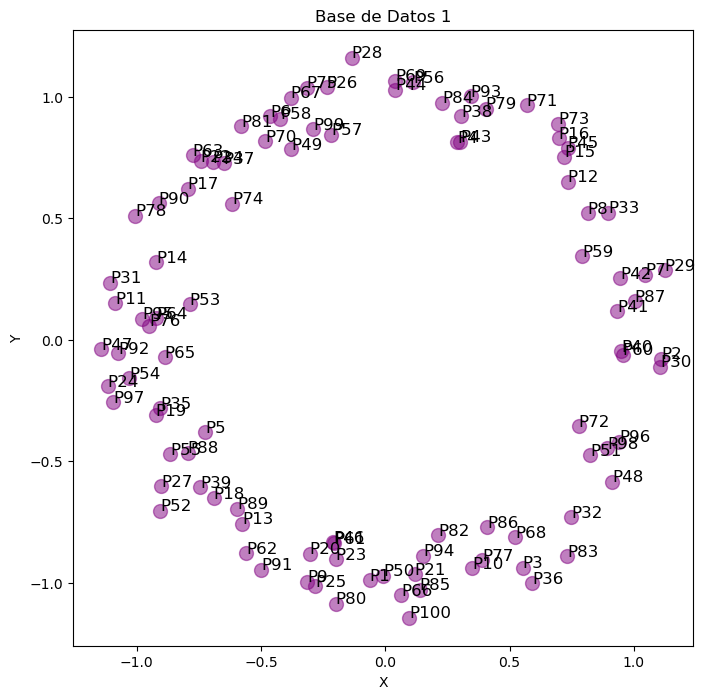

In [78]:
# Creamos una columna nueva con el número del punto (P1)
num = np.arange(1,len(df1)+1,1)
num = ['P'+str(i) for i in num]
df1["Point"] = num

# Convertimos la columna "Point" en el índice de la tabla
df1.set_index('Point', inplace=True)
df1.head()

# Graficamos los puntos con el índice como etiqueta
plt.figure(figsize=(8,8))
plt.scatter(df1['0'], df1['1'], s=100, c='purple', alpha=0.5)
for i, txt in enumerate(df1.index):
    plt.annotate(txt, (df1['0'][i], df1['1'][i]), fontsize=12)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Base de Datos 1')
plt.show()




A primera vista después de graficar todos los puntos de la base de datos 1, se puede observar que los puntos están distribuidos en un círculo, por lo que se espera que los diagramas de persistencia de Rips, Cech y Alpha sean similares.

### Complejo de Rips

Nuestra base de datos está en el plano R^2, por lo que la dimensión máxima del complejo simplicial de Rips debe ser 2. El parámetro $r$ es la distancia máxima entre dos puntos para que se conecten por una arista.

In [79]:
dist = pd.DataFrame(squareform(pdist(df1), "euclidian"), columns=df1.index.values, index=df1.index.values)

max_dist = dist.values.max()
print("La distancia máxima entre los puntos es:", round(max_dist, 5))



La distancia máxima entre los puntos es: 2.31669


Dada la distancia máxima, podemos elegir $r = 2.5$

In [80]:
rips_complex = gudhi.RipsComplex(distance_matrix=dist.values, max_edge_length=2.5)

simplex_tree = rips_complex.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex is of dimension ' + repr(simplex_tree.dimension()) + ' - ' + \
                repr(simplex_tree.num_simplices()) + ' simplices - ' + \
                repr(simplex_tree.num_vertices()) + ' vertices.'
print(result_str)
fmt = '%s -> %.2f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))


Rips complex is of dimension 2 - 166750 simplices - 100 vertices.
[0] -> 0.00
[1] -> 0.00
[2] -> 0.00
[3] -> 0.00
[4] -> 0.00
[5] -> 0.00
[6] -> 0.00
[7] -> 0.00
[8] -> 0.00
[9] -> 0.00
[10] -> 0.00
[11] -> 0.00
[12] -> 0.00
[13] -> 0.00
[14] -> 0.00
[15] -> 0.00
[16] -> 0.00
[17] -> 0.00
[18] -> 0.00
[19] -> 0.00
[20] -> 0.00
[21] -> 0.00
[22] -> 0.00
[23] -> 0.00
[24] -> 0.00
[25] -> 0.00
[26] -> 0.00
[27] -> 0.00
[28] -> 0.00
[29] -> 0.00
[30] -> 0.00
[31] -> 0.00
[32] -> 0.00
[33] -> 0.00
[34] -> 0.00
[35] -> 0.00
[36] -> 0.00
[37] -> 0.00
[38] -> 0.00
[39] -> 0.00
[40] -> 0.00
[41] -> 0.00
[42] -> 0.00
[43] -> 0.00
[44] -> 0.00
[45] -> 0.00
[46] -> 0.00
[47] -> 0.00
[48] -> 0.00
[49] -> 0.00
[50] -> 0.00
[51] -> 0.00
[52] -> 0.00
[53] -> 0.00
[54] -> 0.00
[55] -> 0.00
[56] -> 0.00
[57] -> 0.00
[58] -> 0.00
[59] -> 0.00
[60] -> 0.00
[61] -> 0.00
[62] -> 0.00
[63] -> 0.00
[64] -> 0.00
[65] -> 0.00
[66] -> 0.00
[67] -> 0.00
[68] -> 0.00
[69] -> 0.00
[70] -> 0.00
[71] -> 0.00
[72] -> 

In [81]:
# Rips complex graph function
def plot_rips_complex(data, R, label="data", col=1, maxdim=2):
    tab10 = cm.get_cmap('tab10')

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_title(label)
    ax.scatter(
        data[:, 0], data[:, 1], label=label,
        s=8, alpha=0.9, c=np.array(tab10([col] * len(data)))
    )

    for xy in data:
        ax.add_patch(mpatches.Circle(xy, radius=R, fc='none', ec=tab10(col), alpha=0.2))

    for i, xy in enumerate(data):
        if maxdim >=1:
            for j in range(i + 1, len(data)):
                pq = data[j]
                if (xy != pq).all() and (np.linalg.norm(xy - pq) <= R):
                    pts = np.array([xy, pq])
                    ax.plot(pts[:, 0], pts[:, 1], color=tab10(col), alpha=0.6, linewidth=1)
                if maxdim == 2:
                    for k in range(j + 1, len(data)):
                        ab = data[k]
                        if ((ab != pq).all()
                                and (np.linalg.norm(xy - pq) <= R)
                                and (np.linalg.norm(xy - ab) <= R)
                                and (np.linalg.norm(pq - ab) <= R)
                        ):
                            pts = np.array([xy, pq, ab])
                            ax.fill(pts[:, 0], pts[:, 1], facecolor=tab10(col), alpha=0.1)
                        pass

    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    pass





/var/folders/dd/fhmd_dws0_d412cq_s690s3c0000gn/T/ipykernel_53362/376097067.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  tab10 = cm.get_cmap('tab10')


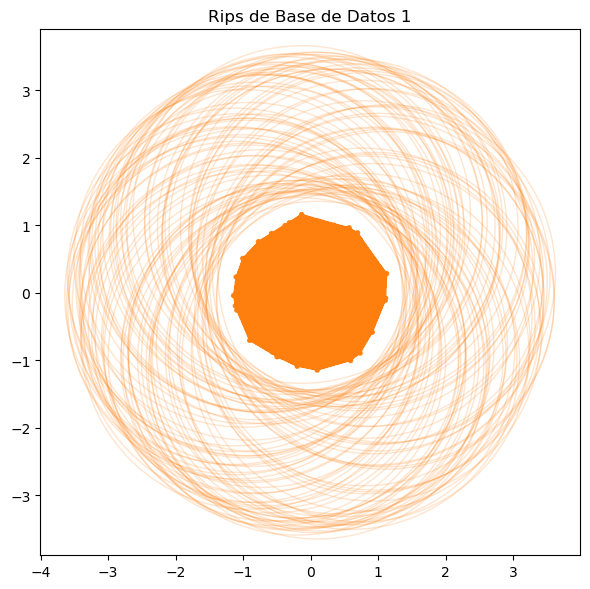

In [82]:
plot_rips_complex(df1.values, R=2.5, label="Rips de Base de Datos 1", col=1, maxdim=2)

Observando la gráfica del complejo simplicial de Rip, se puede observar que el complejo simplicial de Rips es un círculo, lo cual es esperado.

### Complejo de Cech

### Complejo de Alpha

## Base de Datos 2

In [83]:
df2 = pd.read_csv('Activity2.csv') # Cargamos la base de datos

# Mostramos la base de datos
display(df2.head())
display(df2.describe())
print("Tamaño del dataframe:", df2.shape)


,0,1
0,1.727350,0.285771
1,1.861161,0.597764
2,0.627520,1.497373
3,0.979559,0.008873
4,0.756204,0.536461


,0,1
count,100.000000,100.000000
mean,-0.018978,0.030507
std,0.816764,0.782374
min,-1.874888,-1.808748
25%,-0.553641,-0.506078
50%,-0.048096,-0.014768
75%,0.555272,0.599522
max,1.861161,1.721905


Tamaño del dataframe: (100, 2)


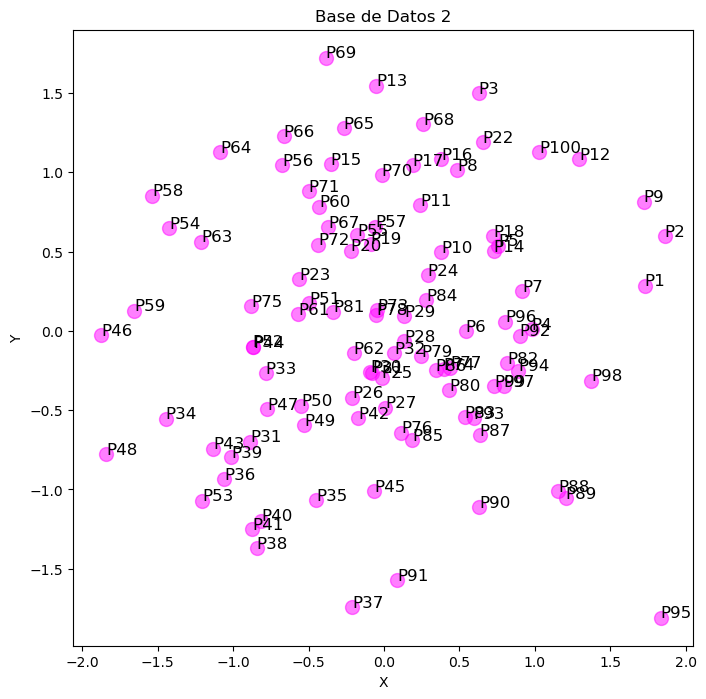

In [84]:
# Creamos una columna nueva con el número del punto (P1)
num = np.arange(1,len(df2)+1,1)
num = ['P'+str(i) for i in num]
df2["Point"] = num

# Convertimos la columna "Point" en el índice de la tabla
df2.set_index('Point', inplace=True)
df2.head()

# Graficamos los puntos con el índice como etiqueta
plt.figure(figsize=(8,8))
plt.scatter(df2['0'], df2['1'], s=100, c='magenta', alpha=0.5)
for i, txt in enumerate(df2.index):
    plt.annotate(txt, (df2['0'][i], df2['1'][i]), fontsize=12)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Base de Datos 2')
plt.show()




A primera vista después de graficar todos los puntos de la base de datos 2, se puede observar que los puntos están distribuidos practicamente aleatoriamente y no se forma una figura geométrica muy clara. Se podría hacer la suposición que forman un círculo, pero no es tan claro como en la base de datos 1. Es por ello que en este caso es incluso más importante realizar los diagramas de persistencia para poder observar la estructura de los datos.

### Complejo de Rips

Nuestra base de datos está en el plano R^2, por lo que la dimensión máxima del complejo simplicial de Rips debe ser 2. El parámetro $r$ es la distancia máxima entre dos puntos para que se conecten por una arista.

In [85]:
dist = pd.DataFrame(squareform(pdist(df2), "euclidian"), columns=df2.index.values, index=df2.index.values)

max_dist = dist.values.max()
print("La distancia máxima entre los puntos es:", round(max_dist, 5))



La distancia máxima entre los puntos es: 4.29339


Dada la distancia máxima, podemos elegir $r = 4.5$

In [92]:
rips_complex = gudhi.RipsComplex(distance_matrix=dist.values, max_edge_length=4.5)

simplex_tree = rips_complex.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex is of dimension ' + repr(simplex_tree.dimension()) + ' - ' + \
                repr(simplex_tree.num_simplices()) + ' simplices - ' + \
                repr(simplex_tree.num_vertices()) + ' vertices.'
print(result_str)
fmt = '%s -> %.2f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))


Rips complex is of dimension 2 - 1695 simplices - 100 vertices.
[0] -> 0.00
[1] -> 0.00
[2] -> 0.00
[3] -> 0.00
[4] -> 0.00
[5] -> 0.00
[6] -> 0.00
[7] -> 0.00
[8] -> 0.00
[9] -> 0.00
[10] -> 0.00
[11] -> 0.00
[12] -> 0.00
[13] -> 0.00
[14] -> 0.00
[15] -> 0.00
[16] -> 0.00
[17] -> 0.00
[18] -> 0.00
[19] -> 0.00
[20] -> 0.00
[21] -> 0.00
[22] -> 0.00
[23] -> 0.00
[24] -> 0.00
[25] -> 0.00
[26] -> 0.00
[27] -> 0.00
[28] -> 0.00
[29] -> 0.00
[30] -> 0.00
[31] -> 0.00
[32] -> 0.00
[33] -> 0.00
[34] -> 0.00
[35] -> 0.00
[36] -> 0.00
[37] -> 0.00
[38] -> 0.00
[39] -> 0.00
[40] -> 0.00
[41] -> 0.00
[42] -> 0.00
[43] -> 0.00
[44] -> 0.00
[45] -> 0.00
[46] -> 0.00
[47] -> 0.00
[48] -> 0.00
[49] -> 0.00
[50] -> 0.00
[51] -> 0.00
[52] -> 0.00
[53] -> 0.00
[54] -> 0.00
[55] -> 0.00
[56] -> 0.00
[57] -> 0.00
[58] -> 0.00
[59] -> 0.00
[60] -> 0.00
[61] -> 0.00
[62] -> 0.00
[63] -> 0.00
[64] -> 0.00
[65] -> 0.00
[66] -> 0.00
[67] -> 0.00
[68] -> 0.00
[69] -> 0.00
[70] -> 0.00
[71] -> 0.00
[72] -> 0.

/var/folders/dd/fhmd_dws0_d412cq_s690s3c0000gn/T/ipykernel_53362/376097067.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  tab10 = cm.get_cmap('tab10')


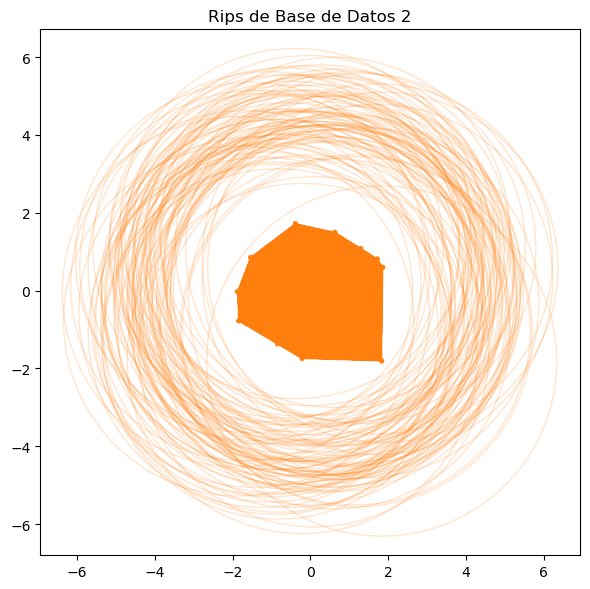

In [86]:
plot_rips_complex(df2.values, R=4.5, label="Rips de Base de Datos 2", col=1, maxdim=2)

Como se puede observar en la gráfica del complejo simplicial de Rip, el complejo simplicial de Rips es un círculo, así como se había predicho. Esto es interesante, ya que a pesar de que los puntos no forman un círculo, el complejo simplicial de Rips sí lo forma. Sin embargo, a diferencia de la base de datos 1, en este caso el círculo no es tan perfecto, tiene una pequeña "deformación".

### Complejo de Cech

### Complejo de Alpha

## Base de Datos 3

In [87]:
df3 = pd.read_csv('Activity3.csv') # Cargamos la base de datos

# Mostramos la base de datos
display(df3.head())
display(df3.describe())
print("Tamaño del dataframe:", df3.shape)

,0,1
0,-16.865905,-9.030913
1,-17.721247,9.601550
2,-19.047260,8.233957
3,-10.252216,-8.925738
4,-17.636004,-10.591064


,0,1
count,100.000000,100.000000
mean,-5.308112,-0.035194
std,11.931284,5.888771
min,-24.843552,-10.591064
25%,-17.030821,-4.482070
50%,-4.112474,-0.247647
75%,4.982264,4.304558
max,14.496662,11.175014


Tamaño del dataframe: (100, 2)


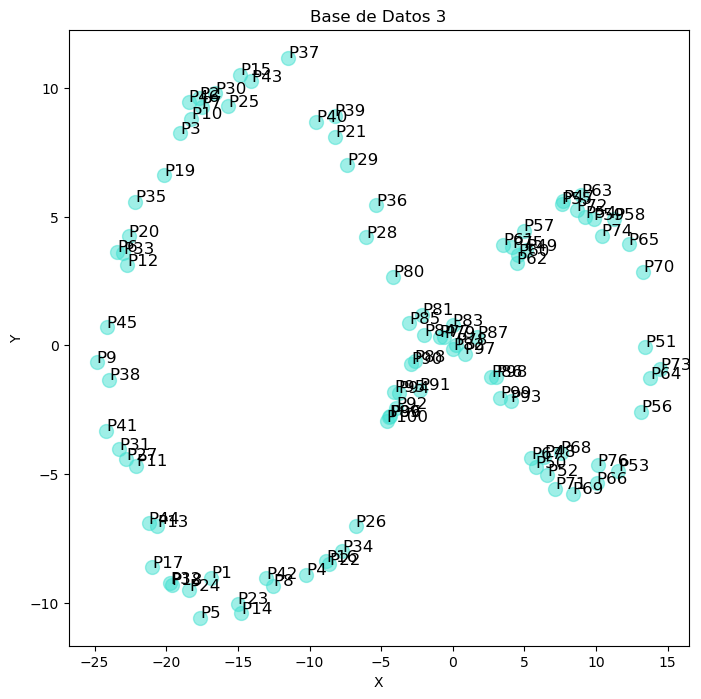

In [88]:
# Creamos una columna nueva con el número del punto (P1)
num = np.arange(1,len(df3)+1,1)
num = ['P'+str(i) for i in num]
df3["Point"] = num

# Convertimos la columna "Point" en el índice de la tabla
df3.set_index('Point', inplace=True)
df3.head()

# Graficamos los puntos con el índice como etiqueta
plt.figure(figsize=(8,8))
plt.scatter(df3['0'], df3['1'], s=100, c='turquoise', alpha=0.5)
for i, txt in enumerate(df1.index):
    plt.annotate(txt, (df3['0'][i], df3['1'][i]), fontsize=12)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Base de Datos 3')
plt.show()




A primera vista después de graficar todos los puntos de la base de datos 3, se puede observar que los puntos están distribuidos como en forma de un infinito. Esto podría interpretarse como dos círculos y se esperaría que los diagramas de persistencia de Rips, Cech y Alpha muestren una estructura similar a la de dos círculos. 

### Complejo de Rips

In [89]:
dist = pd.DataFrame(squareform(pdist(df3), "euclidian"), columns=df3.index.values, index=df3.index.values)

max_dist = dist.values.max()
print("La distancia máxima entre los puntos es:", round(max_dist, 5))



La distancia máxima entre los puntos es: 39.3412


Dada la distancia máxima, podemos elegir $r = 40$

In [90]:
rips_complex = gudhi.RipsComplex(distance_matrix=dist.values, max_edge_length=40)

simplex_tree = rips_complex.create_simplex_tree(max_dimension=2)
result_str = 'Rips complex is of dimension ' + repr(simplex_tree.dimension()) + ' - ' + \
                repr(simplex_tree.num_simplices()) + ' simplices - ' + \
                repr(simplex_tree.num_vertices()) + ' vertices.'
print(result_str)
fmt = '%s -> %.2f'
for filtered_value in simplex_tree.get_filtration():
    print(fmt % tuple(filtered_value))


Rips complex is of dimension 2 - 166750 simplices - 100 vertices.
[0] -> 0.00
[1] -> 0.00
[2] -> 0.00
[3] -> 0.00
[4] -> 0.00
[5] -> 0.00
[6] -> 0.00
[7] -> 0.00
[8] -> 0.00
[9] -> 0.00
[10] -> 0.00
[11] -> 0.00
[12] -> 0.00
[13] -> 0.00
[14] -> 0.00
[15] -> 0.00
[16] -> 0.00
[17] -> 0.00
[18] -> 0.00
[19] -> 0.00
[20] -> 0.00
[21] -> 0.00
[22] -> 0.00
[23] -> 0.00
[24] -> 0.00
[25] -> 0.00
[26] -> 0.00
[27] -> 0.00
[28] -> 0.00
[29] -> 0.00
[30] -> 0.00
[31] -> 0.00
[32] -> 0.00
[33] -> 0.00
[34] -> 0.00
[35] -> 0.00
[36] -> 0.00
[37] -> 0.00
[38] -> 0.00
[39] -> 0.00
[40] -> 0.00
[41] -> 0.00
[42] -> 0.00
[43] -> 0.00
[44] -> 0.00
[45] -> 0.00
[46] -> 0.00
[47] -> 0.00
[48] -> 0.00
[49] -> 0.00
[50] -> 0.00
[51] -> 0.00
[52] -> 0.00
[53] -> 0.00
[54] -> 0.00
[55] -> 0.00
[56] -> 0.00
[57] -> 0.00
[58] -> 0.00
[59] -> 0.00
[60] -> 0.00
[61] -> 0.00
[62] -> 0.00
[63] -> 0.00
[64] -> 0.00
[65] -> 0.00
[66] -> 0.00
[67] -> 0.00
[68] -> 0.00
[69] -> 0.00
[70] -> 0.00
[71] -> 0.00
[72] -> 

/var/folders/dd/fhmd_dws0_d412cq_s690s3c0000gn/T/ipykernel_53362/376097067.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  tab10 = cm.get_cmap('tab10')


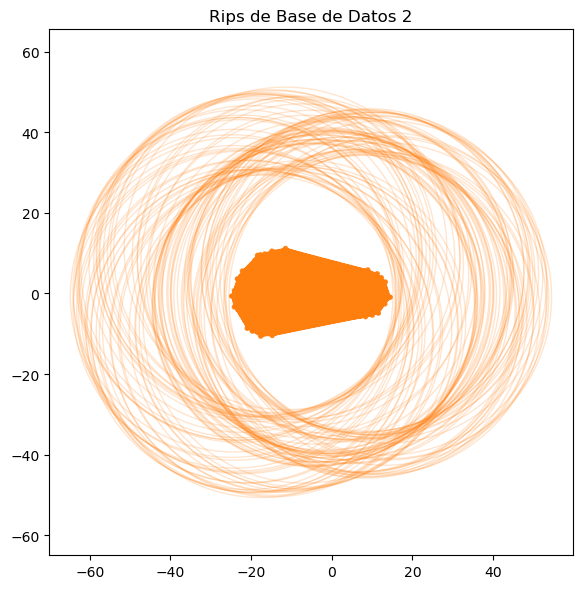

In [91]:
plot_rips_complex(df3.values, R=40, label="Rips de Base de Datos 2", col=1, maxdim=2)

Como se puede observar, el complejo simplicial de Rips son dos círculos que están un poco sobrepuestos, así como un infinito. Esto tiene sentido, ya que los puntos originales están distribuidos como un infinito.

### Complejo de Cech

### Complejo de Alpha